In [62]:
zip_path = '/content/drive/My\ Drive/BCML/FinalProject/chest_xray_backup.zip'

!cp {zip_path} /content/

!cd /content/

!unzip -q /content/chest_xray_backup.zip -d /content

!rm /content/chest_xray_backup.zip

replace /content/chest_xray_backup/test/NORMAL/IM-0001-0001.jpeg? [y]es, [n]o, [A]ll, [N]one, [r]ename: A


In [63]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
import cv2
import datetime
import pandas as pd
from numpy import expand_dims

from sklearn.metrics import classification_report,confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import auc

import keras
from tensorflow.keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Dense, Conv2D , MaxPool2D , Flatten , Dropout , BatchNormalization,MaxPooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD , RMSprop,Adam
from keras.preprocessing.image import ImageDataGenerator,img_to_array, load_img
from keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.callbacks import TensorBoard
from keras.models import load_model


# **Definisi Function**

In [64]:
labels = [ 'NORMAL','PNEUMONIA']
img_size = 200
dataset_dir_train = '/content/chest_xray_backup/train'
dataset_dir_val = '/content/chest_xray_backup/val'
dataset_dir_test = '/content/chest_xray_backup/test'

def get_training_data(data_dir):
    data = [] 
    for label in labels: 
        path = os.path.join(data_dir, label)
        class_num = labels.index(label)
        for img in os.listdir(path):
            try:
                img_arr = cv2.imread(os.path.join(path, img), cv2.IMREAD_GRAYSCALE)
                resized_arr = cv2.resize(img_arr, (img_size, img_size)) 
                data.append([resized_arr, class_num])
            except Exception as e:
                print(e)
    return np.array(data)

def process_data(img):
    img = np.array(img)/255.0
    img = np.reshape(img, (200,200,1))
    return img

def compose_dataset(df):
    data = []
    labels = []

    for img, label in df.values:
        data.append(process_data(img))
        labels.append(label)
        
    return np.array(data), np.array(labels)

def imagedatagenerator(param):
    test_Image_DG=cv2.imread('/content/chest_xray_backup/train/NORMAL/IM-0115-0001.jpeg', cv2.IMREAD_GRAYSCALE)   # Reading an Image
    test_Image_DG=cv2.resize(test_Image_DG,(200,200))              
    test_Image_DG = np.array(test_Image_DG)/255.0
    test_Image_DG = np.reshape(test_Image_DG, (200,200,1))
    input_image_DG= np.expand_dims(test_Image_DG, axis=0)

    if param == "rotation_range":
        datagen_rotation_range = ImageDataGenerator(rotation_range =30)
        it = datagen_rotation_range.flow(input_image_DG, batch_size=1)
    elif param == "zoom_range":
        datagen_zoom_range = ImageDataGenerator(zoom_range =0.2)
        it = datagen_zoom_range.flow(input_image_DG, batch_size=1)
    elif param == "width_shift_range":
        datagen_width_shift = ImageDataGenerator(width_shift_range =0.1)
        it = datagen_width_shift.flow(input_image_DG, batch_size=1)
    elif param == "height_shift_range":
        datagen_height_shift_range = ImageDataGenerator(height_shift_range =0.1)
        it = datagen_height_shift_range.flow(input_image_DG, batch_size=1)
    elif param == "horizontal_flip":
        datagen_horizontal_flip = ImageDataGenerator(horizontal_flip =True)
        it = datagen_horizontal_flip.flow(input_image_DG, batch_size=1)
    elif param == "All":
        datagen_all = ImageDataGenerator(rotation_range =30,zoom_range =0.2,width_shift_range =0.1,height_shift_range =0.1,horizontal_flip =True)
        it = datagen_all.flow(input_image_DG, batch_size=1)

    fig=plt.figure(figsize=(30,30))
    for i in range(8):
        ax=fig.add_subplot(1,8,i+1)
        batch = it.next()
        image = batch[0]
        image = image[:,:,0]
        ax.imshow(image,cmap='gray')
    return

# **Mengambil Data Image**

In [65]:
train = get_training_data(dataset_dir_train)
test = get_training_data(dataset_dir_test)
val = get_training_data(dataset_dir_val)

In [66]:
train[0][0]

array([[61, 68, 75, ..., 26, 12,  0],
       [63, 68, 78, ..., 23, 12,  0],
       [62, 69, 78, ..., 25, 16,  0],
       ...,
       [ 0,  0,  0, ...,  0,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0]], dtype=uint8)

In [67]:
labels[train[0][1]]

'NORMAL'

In [68]:
labels[train[-1][1]]

'PNEUMONIA'

In [69]:
train_df = pd.DataFrame(train, columns=['image', 'label'])
test_df = pd.DataFrame(test, columns=['image', 'label'])
val_df = pd.DataFrame(val, columns=['image', 'label'])

In [70]:
print(train_df)

                                                  image label
0     [[61, 68, 75, 76, 84, 89, 89, 93, 91, 88, 86, ...     0
1     [[7, 6, 6, 6, 5, 6, 5, 6, 5, 6, 5, 6, 5, 5, 5,...     0
2     [[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...     0
3     [[78, 78, 75, 139, 169, 137, 120, 116, 117, 12...     0
4     [[33, 26, 32, 37, 44, 50, 53, 52, 58, 60, 63, ...     0
...                                                 ...   ...
5211  [[31, 29, 29, 31, 31, 34, 34, 31, 29, 28, 28, ...     1
5212  [[16, 15, 20, 21, 21, 254, 23, 19, 255, 20, 21...     1
5213  [[16, 17, 19, 19, 18, 17, 20, 20, 22, 104, 246...     1
5214  [[0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 8, 13, 30, 43,...     1
5215  [[3, 4, 9, 13, 18, 21, 21, 21, 24, 26, 30, 42,...     1

[5216 rows x 2 columns]


# **Visualisasi Data**

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


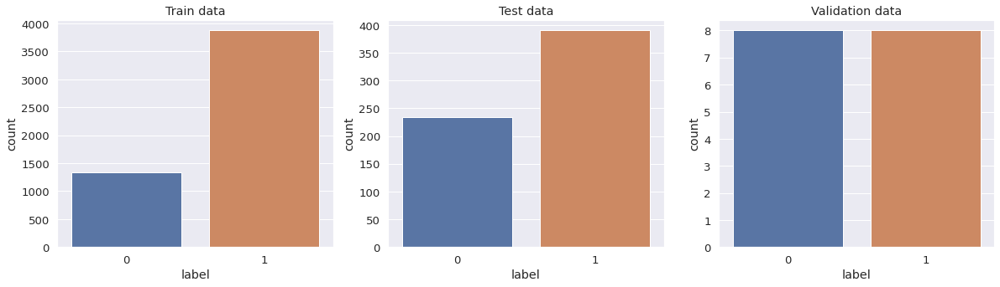

In [71]:
plt.figure(figsize=(20,5))

plt.subplot(1,3,1)
sns.countplot(train_df['label'])
plt.title('Train data')

plt.subplot(1,3,2)
sns.countplot(test_df['label'])
plt.title('Test data')

plt.subplot(1,3,3)
sns.countplot(val_df['label'])
plt.title('Validation data')

plt.show()

Text(0.5, 1.0, 'PNEUMONIA')

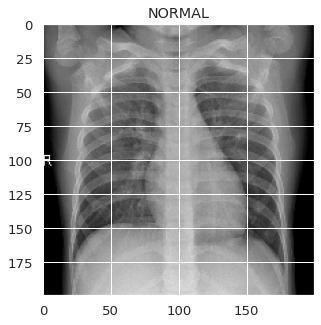

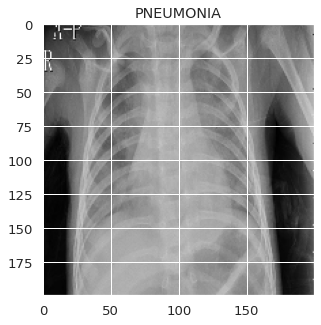

In [72]:
plt.figure(figsize = (5,5))
plt.imshow(train[0][0], cmap='gray')
plt.title(labels[train[0][1]])

plt.figure(figsize = (5,5))
plt.imshow(train[-1][0], cmap='gray')
plt.title(labels[train[-1][1]])

# **Feature Engineering**

In [73]:
feature_train, label_train = compose_dataset(train_df)
feature_test, label_test = compose_dataset(test_df)
feature_val, label_val = compose_dataset(val_df)

In [74]:
print('Train data shape: {}, Labels shape: {}'.format(feature_train.shape, label_train.shape))
print('Test data shape: {}, Labels shape: {}'.format(feature_test.shape, label_test.shape))
print('Validation data shape: {}, Labels shape: {}'.format(feature_val.shape, label_val.shape))

Train data shape: (5216, 200, 200, 1), Labels shape: (5216,)
Test data shape: (624, 200, 200, 1), Labels shape: (624,)
Validation data shape: (16, 200, 200, 1), Labels shape: (16,)


In [75]:
print(label_val)

[0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1]


In [76]:
train_datagen = ImageDataGenerator(rotation_range = 30,  # randomly rotate images in the range (degrees, 0 to 180)
                                   zoom_range = 0.2, # Randomly zoom image 
                                   width_shift_range=0.1,  # randomly shift images horizontally (fraction of total width)
                                   height_shift_range=0.1,  # randomly shift images vertically (fraction of total height)
                                   horizontal_flip = True)  # randomly flip images

train_datagen.fit(feature_train)

In [77]:
label_train = to_categorical(label_train)
label_test = to_categorical(label_test)
label_val = to_categorical(label_val)

## **Visualisasi Image Data Generator yang di gunakan**

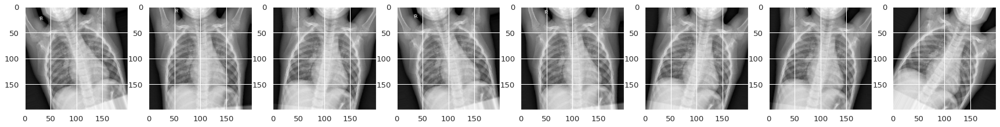

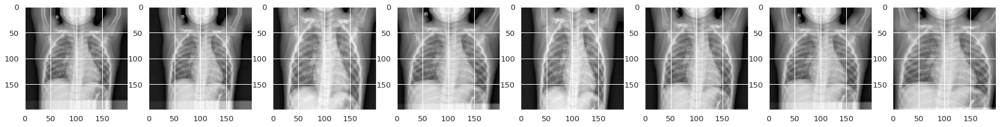

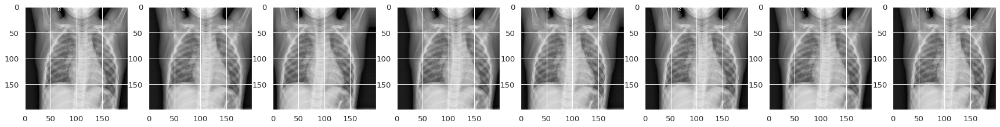

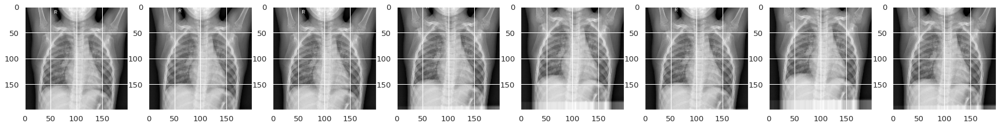

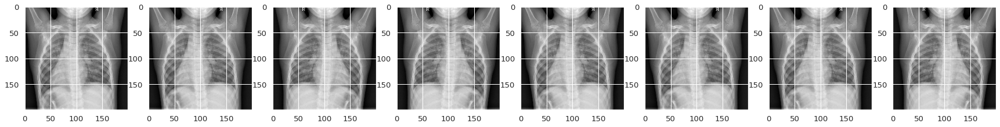

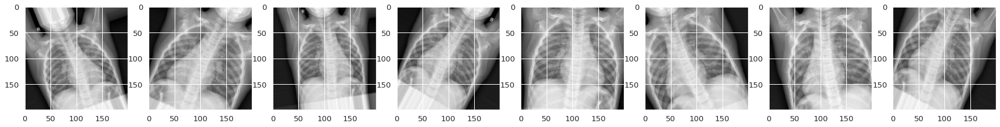

In [78]:
list_param=["rotation_range","zoom_range","width_shift_range","height_shift_range","horizontal_flip","All"]

for i in list_param:
    imagedatagenerator(i)

# **Model CNN**

In [79]:
model = Sequential()

model.add(Conv2D(filters=8, kernel_size=(7,7), padding='same', activation='relu', input_shape=(200, 200, 1)))
model.add(Conv2D(filters=8, kernel_size=(7,7), padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(3,3)))

model.add(Conv2D(filters=16, kernel_size=(5,5), padding='same', activation='relu'))
model.add(Conv2D(filters=16, kernel_size=(5,5), padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(3,3)))

model.add(Conv2D(filters=32, kernel_size=(3,3), padding='same', activation='relu'))
model.add(Conv2D(filters=32, kernel_size=(3,3), padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Conv2D(filters=64, kernel_size=(3,3), padding='same', activation='relu'))
model.add(Conv2D(filters=64, kernel_size=(3,3), padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Conv2D(filters=128, kernel_size=(3,3), padding='same', activation='relu'))
model.add(Conv2D(filters=128, kernel_size=(3,3), padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Flatten())

model.add(Dense(128, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(2, activation='softmax'))

optimizer = Adam(lr=0.0001, decay=1e-5)
model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_10 (Conv2D)           (None, 200, 200, 8)       400       
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 200, 200, 8)       3144      
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 66, 66, 8)         0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 66, 66, 16)        3216      
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 66, 66, 16)        6416      
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 22, 22, 16)        0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 22, 22, 32)       

In [80]:
i=1
for layer in model.layers:
    if 'conv' in layer.name: 
        filters, bias= layer.get_weights()
        print('Filters Shape: '+ str(filters.shape, )+" " + 'Bias Shape: '+str(bias.shape)+ "<---- layer: "+str(i))
        print("-----------")
        i=i+1

Filters Shape: (7, 7, 1, 8) Bias Shape: (8,)<---- layer: 1
-----------
Filters Shape: (7, 7, 8, 8) Bias Shape: (8,)<---- layer: 2
-----------
Filters Shape: (5, 5, 8, 16) Bias Shape: (16,)<---- layer: 3
-----------
Filters Shape: (5, 5, 16, 16) Bias Shape: (16,)<---- layer: 4
-----------
Filters Shape: (3, 3, 16, 32) Bias Shape: (32,)<---- layer: 5
-----------
Filters Shape: (3, 3, 32, 32) Bias Shape: (32,)<---- layer: 6
-----------
Filters Shape: (3, 3, 32, 64) Bias Shape: (64,)<---- layer: 7
-----------
Filters Shape: (3, 3, 64, 64) Bias Shape: (64,)<---- layer: 8
-----------
Filters Shape: (3, 3, 64, 128) Bias Shape: (128,)<---- layer: 9
-----------
Filters Shape: (3, 3, 128, 128) Bias Shape: (128,)<---- layer: 10
-----------


## **visualisasi Layer Filter CNN ke 1**

(7, 7, 1, 8) (8,)


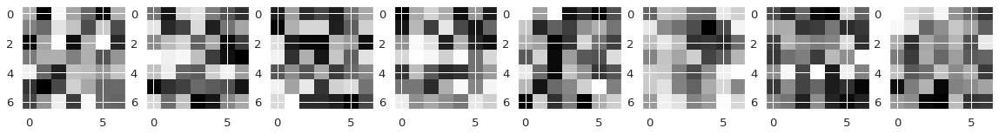

In [101]:
layer= model.layers
layer_1= layer[0]
filter_1, bias_1= layer_1.get_weights()
print(filter_1.shape, bias_1.shape)

#Normalize the weights
f_min, f_max = filter_1.min(), filter_1.max()
filter_1 = (filter_1 - f_min) / (f_max - f_min)
filter_1 = filter_1[:,:,0]

fig= plt.figure(figsize=(20,20))
for i in range(8):
    ax = fig.add_subplot(1,8,i+1)
    ax.imshow(filter_1[:,:,i], cmap='gray')

## **visualisasi Layer Filter CNN ke 2**

(7, 7, 8, 8) (8,)


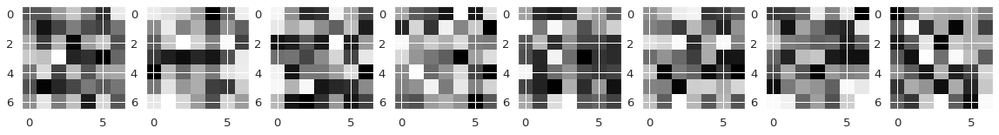

In [82]:
layer_2= layer[1]
filter_2, bias_2= layer_2.get_weights()
print(filter_2.shape, bias_2.shape)

#Normalize the weights
f_min2, f_max2 = filter_2.min(), filter_2.max()
filter_2 = (filter_2 - f_min2) / (f_max2 - f_min2)
filter_2 = filter_2[:,:,0]

fig= plt.figure(figsize=(20,20))
for i in range(8):
    ax = fig.add_subplot(1,8,i+1)
    ax.imshow(filter_2[:,:,i], cmap='gray')

## **Hasil Implementasi filter CNN ke 1**

(1, 200, 200, 1)
(1, 200, 200, 8)


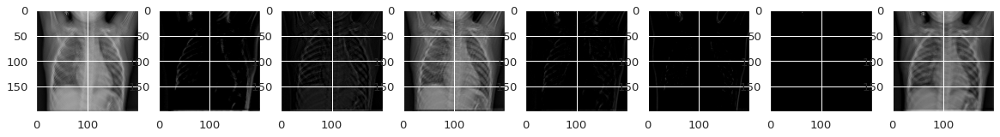

In [83]:
inp= model.inputs 
out1= model.layers[0].output  
feature_map_1= Model(inputs= inp, outputs= out1)  

img=cv2.imread('/content/chest_xray_backup/train/NORMAL/IM-0115-0001.jpeg', cv2.IMREAD_GRAYSCALE)   # Reading an Image
img=cv2.resize(img,(200,200))               # Resizing an Image
img = np.array(img)/255.0
img = np.reshape(img, (200,200,1))
input_img= np.expand_dims(img, axis=0)      # Expanding the dimension
print(input_img.shape)                      # Printing out the size of the Input Image
#-------------------------------------#---------------------------
f1=feature_map_1.predict(input_img)        # predicting out the Image 
print(f1.shape)                            # Let's see the shape
fig= plt.figure(figsize=(20,20))
for i in range(8):
    ax=fig.add_subplot(1,8,i+1)
    ax.imshow(f1[0,:,:,i],cmap='gray')

## **Hasil Implementasi filter CNN ke 2**

(1, 200, 200, 8)


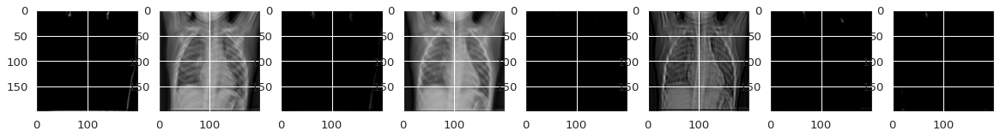

In [84]:
inp= model.inputs 
out2= model.layers[1].output  
feature_map_2= Model(inputs= inp, outputs= out2)  

f2=feature_map_2.predict(input_img)        # predicting out the Image 
print(f2.shape)                            # Let's see the shape
fig= plt.figure(figsize=(20,20))
for i in range(8):
    ax=fig.add_subplot(1,8,i+1)
    ax.imshow(f2[0,:,:,i],cmap='gray')

# **Melatih Model pada Validation Set**

In [85]:
filepath="weights_best.h5"
checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
callbacks_list = [checkpoint]

logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S")) # Tempat dimana log tensorboard akan di
callbacks_list.append(TensorBoard(logdir, histogram_freq=1))

In [86]:
history = model.fit(train_datagen.flow(feature_train,label_train, batch_size=4), validation_data=(feature_val, label_val), epochs = 25, verbose = 1, callbacks=callbacks_list)

Epoch 1/25
1301/1304 [============================>.] - ETA: 0s - loss: 0.5351 - accuracy: 0.7606
Epoch 00001: val_accuracy improved from -inf to 0.56250, saving model to weights_best.h5
1304/1304 [==============================] - 23s 17ms/step - loss: 0.5344 - accuracy: 0.7609 - val_loss: 0.9742 - val_accuracy: 0.5625
Epoch 2/25
1303/1304 [============================>.] - ETA: 0s - loss: 0.2722 - accuracy: 0.8872
Epoch 00002: val_accuracy improved from 0.56250 to 0.62500, saving model to weights_best.h5
1304/1304 [==============================] - 22s 17ms/step - loss: 0.2721 - accuracy: 0.8871 - val_loss: 0.9094 - val_accuracy: 0.6250
Epoch 3/25
1302/1304 [============================>.] - ETA: 0s - loss: 0.2126 - accuracy: 0.9174
Epoch 00003: val_accuracy did not improve from 0.62500
1304/1304 [==============================] - 22s 17ms/step - loss: 0.2126 - accuracy: 0.9174 - val_loss: 1.6995 - val_accuracy: 0.5000
Epoch 4/25
1304/1304 [==============================] - ETA: 0s -

In [87]:
%load_ext tensorboard

%tensorboard --logdir logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 495), started 1:03:29 ago. (Use '!kill 495' to kill it.)

<IPython.core.display.Javascript object>

# **Evaluasi Model Pada data test**

In [88]:
print("Loss of the model is - " , model.evaluate(feature_test,label_test)[0])
print("Accuracy of the model is - " , model.evaluate(feature_test,label_test)[1]*100 , "%")

20/20 [==============================] - 0s 12ms/step - loss: 0.3001 - accuracy: 0.9087
Loss of the model is -  0.3000510334968567
20/20 [==============================] - 0s 11ms/step - loss: 0.3001 - accuracy: 0.9087
Accuracy of the model is -  90.86538553237915 %


In [89]:
predictions = np.argmax(model.predict(feature_test), axis=-1)
predictions = predictions.reshape(1,-1)[0]
predictions[:100]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0,
       1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0])

In [90]:
label_test_hat = model.predict(feature_test, batch_size=4)
label_test_hat = np.argmax(label_test_hat, axis=1)
label_test = np.argmax(label_test, axis=1)

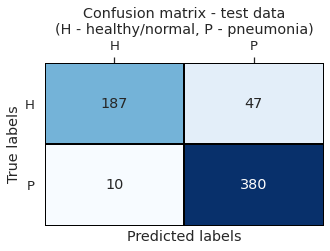

Classification report on test data
                     precision    recall  f1-score   support

   Normal (Class 0)       0.95      0.80      0.87       234
Pneumonia (Class 1)       0.89      0.97      0.93       390

           accuracy                           0.91       624
          macro avg       0.92      0.89      0.90       624
       weighted avg       0.91      0.91      0.91       624



In [91]:
# calculate confusion matrix & classification report
conf_m = confusion_matrix(label_test, label_test_hat)
clas_r = classification_report(label_test, label_test_hat,target_names = ['Normal (Class 0)','Pneumonia (Class 1)'])

# plot confusion matrix as heatmap
plt.figure(figsize=(5,3))
sns.set(font_scale=1.2)
ax = sns.heatmap(conf_m, annot=True,xticklabels=['H', 'P'], yticklabels=['H', 'P'], cbar=False, cmap='Blues',linewidths=1, linecolor='black', fmt='.0f')
plt.yticks(rotation=0)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
ax.xaxis.set_ticks_position('top') 
plt.title('Confusion matrix - test data\n(H - healthy/normal, P - pneumonia)')
plt.show()

# print classification report
print('Classification report on test data')
print(clas_r)

# **Visualisasi Data Validation**

In [92]:
label_val_hat = model.predict(feature_val, batch_size=4)
label_val_hat = np.argmax(label_val_hat, axis=1)
label_val = np.argmax(label_val, axis=1)

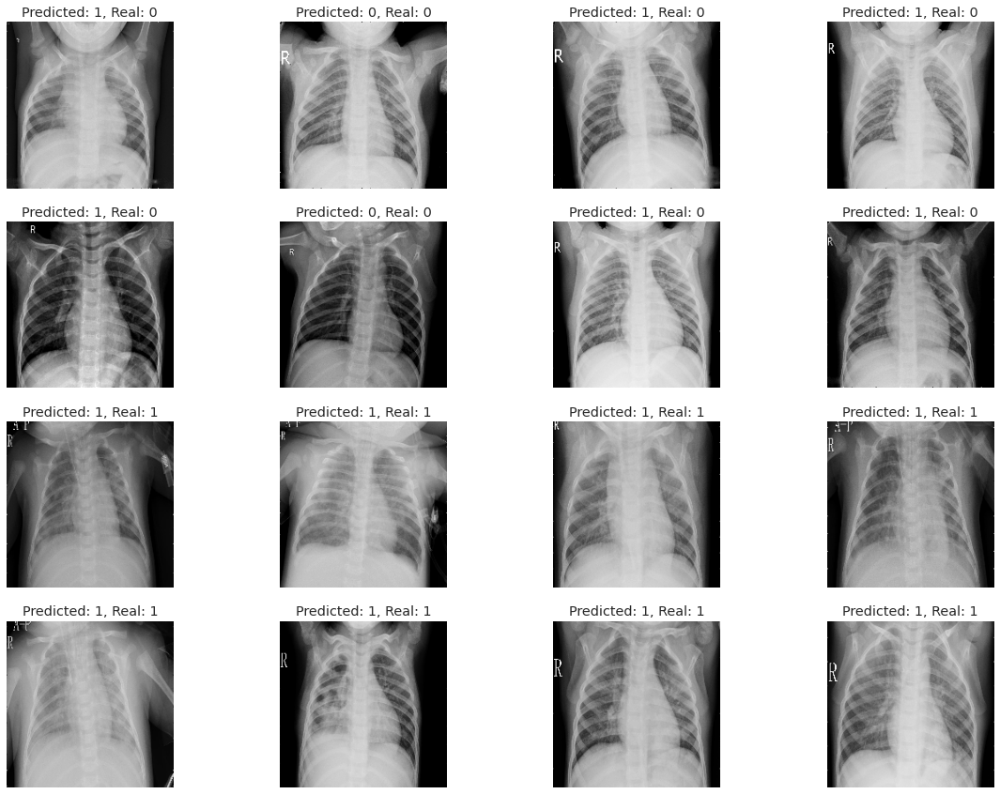

In [93]:
plt.figure(figsize=(20,15))
for i,x in enumerate(feature_val):
    plt.subplot(4,4,i+1)
    plt.imshow(x.reshape(200, 200), cmap='gray')
    plt.axis('off')
    plt.title('Predicted: {}, Real: {}'.format(label_val_hat[i], label_val[i]))

# **RUC-AUC Curve**

## **Data Test**

In [94]:
label_pred = model.predict(feature_test,batch_size= 4)
label_pred = np.argmax(label_pred, axis=1)

In [95]:
fpr, tpr, threshold = roc_curve(label_test, label_pred)
auc_test = auc(fpr, tpr)

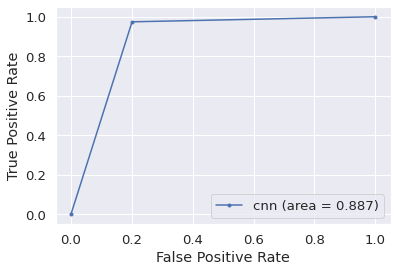

In [96]:
plt.plot(fpr, tpr, marker='.', label='cnn (area = {:.3f})'.format(auc_test))
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show the legend
plt.legend()
# show the plot
plt.show()

## **Data Train**

In [97]:
train_pred = model.predict(feature_train,batch_size= 4)
train_pred = np.argmax(train_pred, axis=1)
train_label_roc = np.argmax(label_train, axis=1)

In [98]:
fpr_train, tpr_train, threshold = roc_curve(train_label_roc, train_pred)
auc_train = auc(fpr_train, tpr_train)

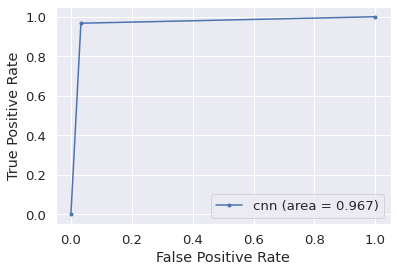

In [99]:
plt.plot(fpr_train, tpr_train, marker='.', label='cnn (area = {:.3f})'.format(auc_train))
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show the legend
plt.legend()
# show the plot
plt.show()